In [1]:
# Import libraries
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# PyTorch dataset"
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler

# PyTorch model
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# For other analysis/ML
import os
import shutil
from torchvision import datasets, transforms
from torch.utils.data import random_split, DataLoader

import torchvision
import torchvision.models as models

from sklearn.metrics import confusion_matrix
import seaborn as sns

import torch
from torch import nn, optim
from torchvision import models


In [2]:
# installs kaggle
! pip install kaggle

# Installs dataset from kaggle. Required kaggle API from profile

In [3]:
! mkdir ~/.kaggle

In [4]:
# May not be needed
! cp kaggle.json ~/.kaggle/


cp: cannot stat 'kaggle.json': No such file or directory


In [5]:
# Also may not be needed
! chmod 600 ~/.kaggle/kaggle.json


chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [6]:
! kaggle datasets download -d emmarex/plantdisease


Dataset URL: https://www.kaggle.com/datasets/emmarex/plantdisease
License(s): unknown
100% 658M/658M [00:30<00:00, 24.0MB/s]
100% 658M/658M [00:30<00:00, 22.3MB/s]


In [7]:
! unzip plantdisease.zip


Streaming output truncated to the last 5000 lines.
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08c033bd-fbc3-445a-88d1-1863070e52ce___YLCV_GCREC 2872.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08dd176c-e9d9-4746-92c3-fa8dc9074347___UF.GRC_YLCV_Lab 03057.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08f78a80-46f5-45a6-937c-4d05d61c08c2___UF.GRC_YLCV_Lab 01895.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0903aa95-6e8a-4abd-a003-126fcd9a5493___YLCV_GCREC 2806.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0911d416-d73d-4c2a-8e45-207a7ceb7c9a___YLCV_GCREC 2773.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/09188838-cc89-4925-94c5-d9563c4cb4bf___UF.GRC_YLCV_Lab 02974.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0922e026-b563-438d-b9ed-74

In [8]:
rm -r plantvillage

The data should show up in the files section on the left

# We are only using the Tomato Folders, as we are trying to classify if a tomato is healthy or has a disease/parasites

In [9]:
# Define the main directory
data_dir = "PlantVillage"

# Create a directory to hold only Tomato folders
tomato_dir = os.path.join(data_dir, "Tomato_Folders")
os.makedirs(tomato_dir, exist_ok=True)

# Filter and copy Tomato folders
for folder in os.listdir(data_dir):
    if folder.startswith("Tomato"):
        shutil.copytree(
            os.path.join(data_dir, folder),
            os.path.join(tomato_dir, folder),
            dirs_exist_ok=True
        )


In [10]:
# For some reason makes a folder within a folder, deletes that folder
os.system('rm -r PlantVillage/Tomato_Folders/Tomato_Folders')


0

# Exploratory Data Analysis

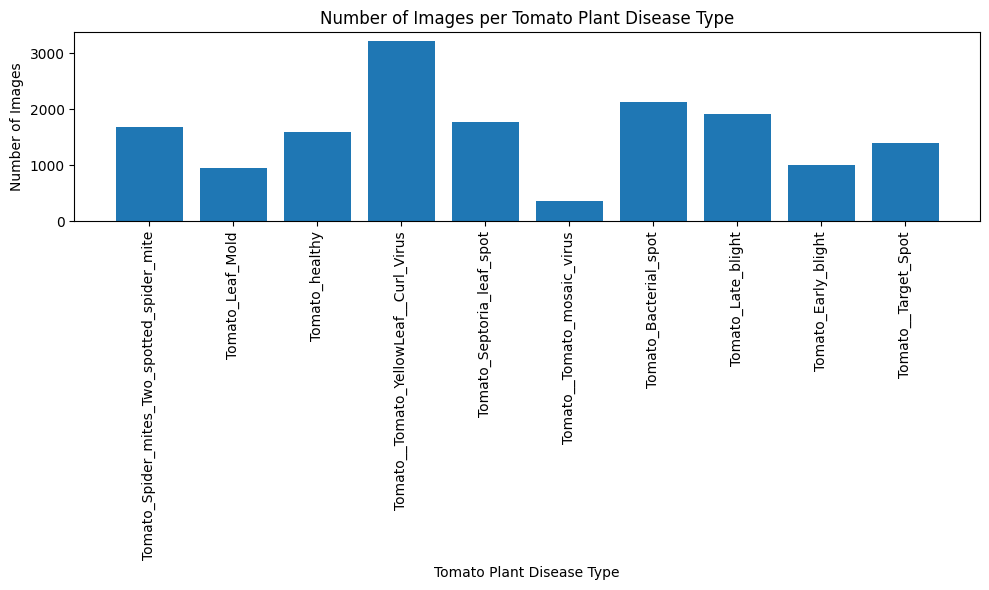

In [11]:
# Define the directory containing the image folders
data_dir = "PlantVillage/Tomato_Folders"

# Count the number of images in each folder
folder_counts = {}
for folder_name in os.listdir(data_dir):
    folder_path = os.path.join(data_dir, folder_name)
    if os.path.isdir(folder_path):
        image_count = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
        folder_counts[folder_name] = image_count

# Create the bar graph
plt.figure(figsize=(10, 6))
plt.bar(folder_counts.keys(), folder_counts.values())
plt.xlabel("Tomato Plant Disease Type")
plt.ylabel("Number of Images")
plt.title("Number of Images per Tomato Plant Disease Type")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

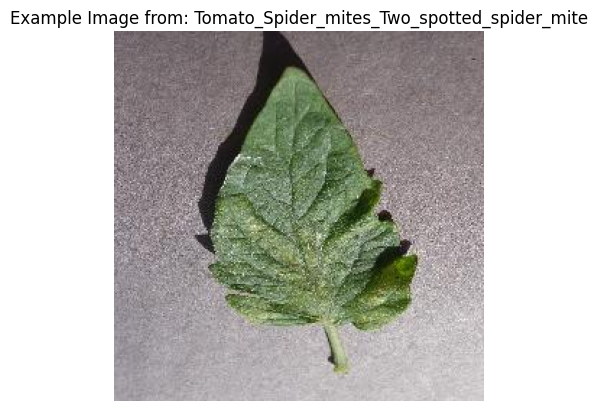

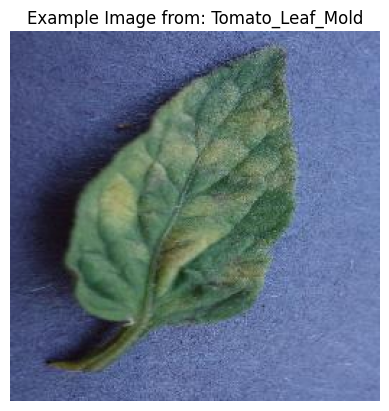

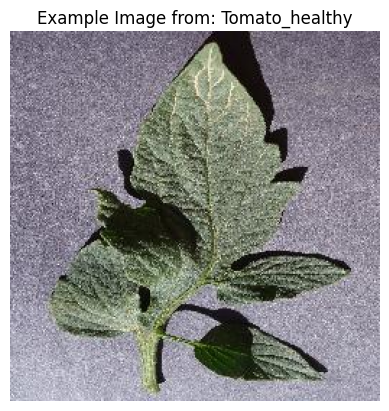

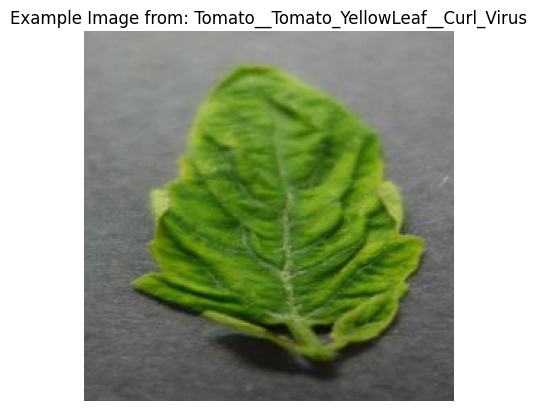

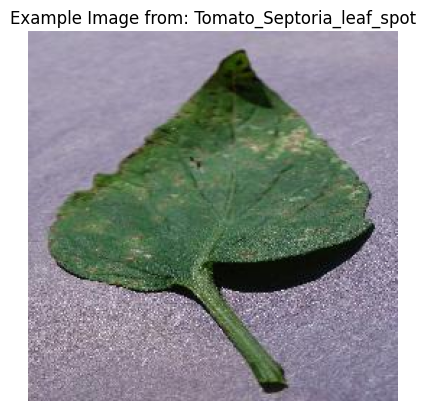

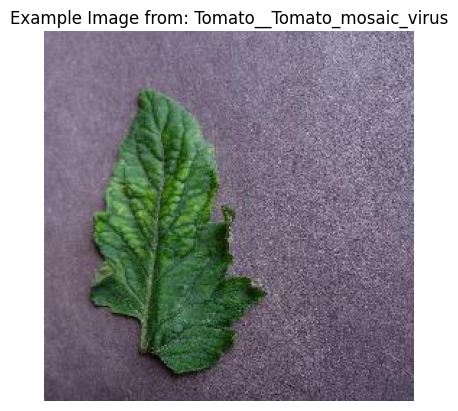

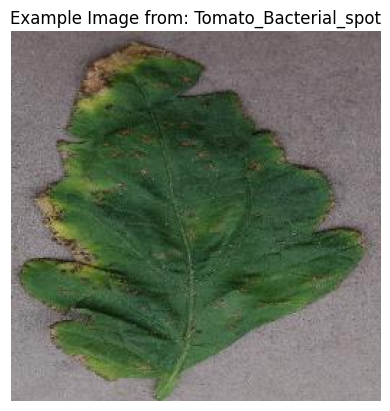

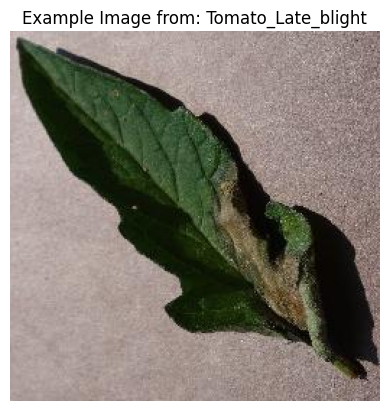

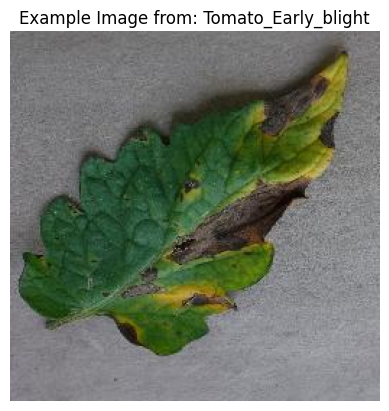

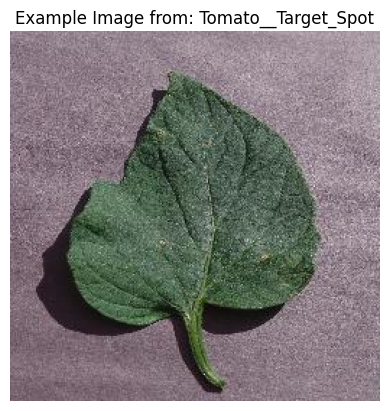

In [ ]:
# Function to display an example image from each class
def show_example_images(data_dir):
    for folder_name in os.listdir(data_dir):
        folder_path = os.path.join(data_dir, folder_name)
        if os.path.isdir(folder_path):
            image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
            if image_files:
                example_image_path = os.path.join(folder_path, image_files[0])  # Get the first image in the folder
                try:
                    img = mpimg.imread(example_image_path)
                    plt.figure()
                    plt.imshow(img)
                    plt.title(f"Example Image from: {folder_name}")
                    plt.axis('off')  # Hide axis ticks and labels
                    plt.show()
                except Exception as e:
                    print(f"Error displaying image {example_image_path}: {e}")
            else:
                print(f"No images found in folder: {folder_name}")


show_example_images(data_dir)

# Transforming Images for Variation and splitting dataset

In [12]:
# Define transformations
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.Resize((256, 256)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Assuming RGB images
])

# Load dataset with transformations
dataset = datasets.ImageFolder(tomato_dir, transform=transform)

# Split dataset into training (80%), validation (10%), and testing (10%)
def split_dataset(dataset, train_ratio=0.8, val_ratio=0.1, test_ratio=0.1):
    assert train_ratio + val_ratio + test_ratio == 1, "Ratios must sum to 1"
    total_size = len(dataset)
    train_size = int(train_ratio * total_size)
    val_size = int(val_ratio * total_size)
    test_size = total_size - train_size - val_size

    return random_split(dataset, [train_size, val_size, test_size])

train_set, val_set, test_set = split_dataset(dataset)

# Create DataLoaders
train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32, shuffle=False)
test_loader = DataLoader(test_set, batch_size=32, shuffle=False)

Number of Images in Validation and Testing Set

Number of images in training set: 12808
Number of images in validation set: 1601
Number of images in testing set: 1602


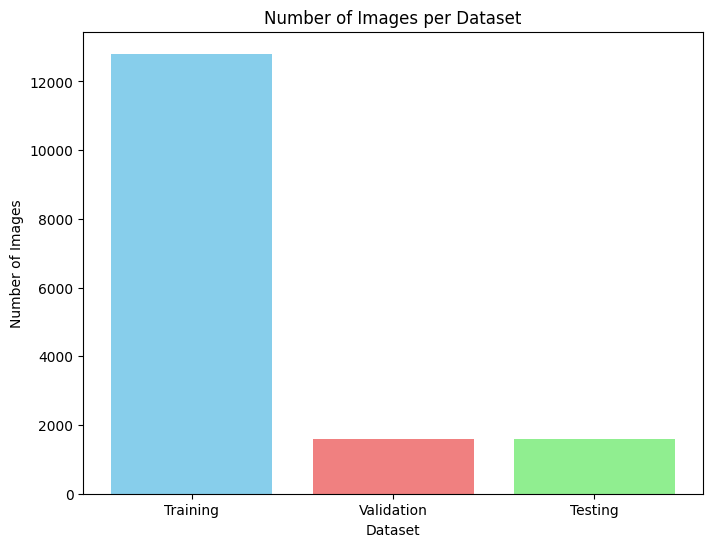

In [13]:
# Number of images in each set
train_count = len(train_set)
val_count = len(val_set)
test_count = len(test_set)

print(f"Number of images in training set: {train_count}")
print(f"Number of images in validation set: {val_count}")
print(f"Number of images in testing set: {test_count}")

# Plotting the counts
set_names = ['Training', 'Validation', 'Testing']
counts = [train_count, val_count, test_count]

plt.figure(figsize=(8, 6))
plt.bar(set_names, counts, color=['skyblue', 'lightcoral', 'lightgreen'])
plt.xlabel("Dataset")
plt.ylabel("Number of Images")
plt.title("Number of Images per Dataset")
plt.show()

In [14]:
# Image classes
classes = dataset.classes

print("Classes:", classes)
print(f"Training set size: {len(train_set)}, Validation set size: {len(val_set)}, Testing set size: {len(test_set)}")

Classes: ['Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']
Training set size: 12808, Validation set size: 1601, Testing set size: 1602


# Visualize Batch of Data



In [ ]:
# helper function to un-normalize and display an image
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    plt.imshow(np.transpose(img, (1, 2, 0)))

In [ ]:
# obtain one batch of training images
dataiter = iter(train_loader)
images, labels = next(dataiter)
images = images.numpy()
images.shape

(32, 3, 256, 256)

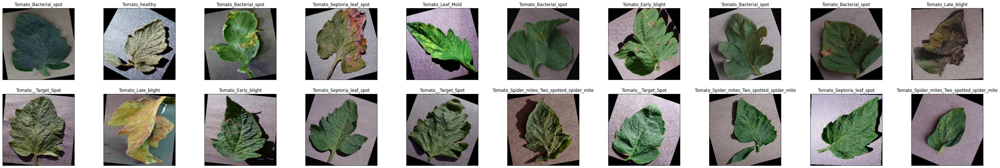

In [ ]:
# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(50, 8))
# display 20 images
for idx in np.arange(20):
    ax = fig.add_subplot(2, 10, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title(classes[labels[idx]])

# Creating the Model

In [15]:
# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


In [16]:
sample_image, _ = dataset[0]
print(f"Sample image size: {sample_image.shape}")

Sample image size: torch.Size([3, 256, 256])


# Models we tried:

In [ ]:
# class Net(nn.Module):
#     def __init__(self):
#         super(Net, self).__init__()
#         # Convolutional layers
#         self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
#         self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
#         # Pooling layer
#         self.pool = nn.MaxPool2d(2, 2)
#         # Fully connected layers
#         self.fc1 = nn.Linear(32 * 64 * 64, 128)
#         self.fc2 = nn.Linear(128, 10)

#         # Dropout
#         self.dropout = nn.Dropout(0.4)


#     def forward(self, x):
#         x = self.pool(F.relu(self.conv1(x)))
#         x = self.pool(F.relu(self.conv2(x)))
#         x = x.view(x.size(0), -1)
#         # add dropout layer
#         x = self.dropout(x)
#         # add 1st hidden layer, with relu activation function
#         x = F.relu(self.fc1(x))
#         # add dropout layer
#         x = self.dropout(x)
#         # add 2nd hidden layer, with relu activation function
#         x = self.fc2(x)
#         return x


In [ ]:
# # Define the updated CNN architecture
# class Net(nn.Module):
#     def __init__(self):
#         super(Net, self).__init__()
#         # convolutional layers
#         self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
#         self.bn1 = nn.BatchNorm2d(16)
#         self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
#         self.bn2 = nn.BatchNorm2d(32)
#         self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
#         self.bn3 = nn.BatchNorm2d(64)
#         # max pooling layer
#         self.pool = nn.MaxPool2d(2, 2)
#         # linear layers
#         self.fc1 = nn.Linear(64 * 32 * 32, 500)
#         self.fc2 = nn.Linear(500, 10)
#         # dropout layer
#         self.dropout = nn.Dropout(0.3)

#     def forward(self, x):
#         x = self.pool(F.relu(self.bn1(self.conv1(x))))
#         x = self.pool(F.relu(self.bn2(self.conv2(x))))
#         x = self.pool(F.relu(self.bn3(self.conv3(x))))
#         x = x.view(x.size(0), -1)
#         x = self.dropout(x)  # Apply dropout
#         x = F.relu(self.fc1(x))
#         x = self.dropout(x)  # Apply dropout
#         x = self.fc2(x)
#         return x

Batch normalization did not give us a good accuracy score

# Final Model with Tuned Hyperparameters

In [ ]:
# Define the CNN architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # convolutional layer (sees 256x256x3 image tensor)
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        # convolutional layer (sees 128x128x16 tensor)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        # convolutional layer (sees 64x64x32 tensor)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        # max pooling layer
        self.pool = nn.MaxPool2d(2, 2)
        # linear layer (64 * 32 * 32 -> 500)
        self.fc1 = nn.Linear(64 * 32 * 32, 500)
        # linear layer (500 -> 10)
        self.fc2 = nn.Linear(500, 10)
        # dropout layer (p=0.4)
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)
        # add dropout layer
        x = self.dropout(x)
        # add 1st hidden layer, with relu activation function
        x = F.relu(self.fc1(x))
        # add dropout layer
        x = self.dropout(x)
        # add 2nd hidden layer, with relu activation function
        x = self.fc2(x)
        return x

In [ ]:
model = Net()
model

Net(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=65536, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=10, bias=True)
  (dropout): Dropout(p=0.4, inplace=False)
)

In [ ]:
if train_on_gpu:
    model = model.cuda()


In [ ]:
# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

# specify optimizer, learning rate and weight decay (L2 Regularization)
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

# KEEP THIS

In [ ]:
# number of epochs to train the model
n_epochs = 30  # Total number of epochs
patience = 5  # Total number of epochs with worse validation loss allowed
worse_epoch_count = 0

valid_loss_min = np.Inf

for epoch in range(1, n_epochs + 1):
    # Keep track of training and validation loss
    train_loss = 0.0
    valid_loss = 0.0

    ###################
    # train the model #
    ###################
    model.train()
    for data, target in train_loader:
        # Move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # Clear the gradients of all optimized variables
        optimizer.zero_grad()
        # Forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # Calculate the batch loss
        loss = criterion(output, target)
        # Backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # Perform a single optimization step (parameter update)
        optimizer.step()
        # Update training loss
        train_loss += loss.item() * data.size(0)

    ######################
    # validate the model #
    ######################
    model.eval()
    with torch.no_grad():
        for data, target in val_loader:
            # Move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            # Forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # Calculate the batch loss
            loss = criterion(output, target)
            # Update average validation loss
            valid_loss += loss.item() * data.size(0)

    # Calculate average losses
    train_loss = train_loss / len(train_loader.sampler)
    valid_loss = valid_loss / len(val_loader.sampler)

    # Print training/validation statistics
    print(f'Epoch: {epoch} \tTraining Loss: {train_loss:.6f} \tValidation Loss: {valid_loss:.6f}')

    # Check if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print(f'Validation loss decreased ({valid_loss_min:.6f} --> {valid_loss:.6f}). Saving model ...')
        torch.save(model.state_dict(), 'model_cifar.pt')
        valid_loss_min = valid_loss
    else:
        worse_epoch_count += 1
        print(f'Validation loss did not improve. Total worse epochs: {worse_epoch_count}/{patience}')
        if worse_epoch_count >= patience:
            print('Early stopping triggered due to total worse epochs.')
            break


Epoch: 1 	Training Loss: 1.205521 	Validation Loss: 0.875182
Validation loss decreased (inf --> 0.875182). Saving model ...
Epoch: 2 	Training Loss: 0.783972 	Validation Loss: 0.663818
Validation loss decreased (0.875182 --> 0.663818). Saving model ...
Epoch: 3 	Training Loss: 0.677550 	Validation Loss: 0.609764
Validation loss decreased (0.663818 --> 0.609764). Saving model ...
Epoch: 4 	Training Loss: 0.618873 	Validation Loss: 0.558378
Validation loss decreased (0.609764 --> 0.558378). Saving model ...
Epoch: 5 	Training Loss: 0.569614 	Validation Loss: 0.514891
Validation loss decreased (0.558378 --> 0.514891). Saving model ...
Epoch: 6 	Training Loss: 0.536490 	Validation Loss: 0.445841
Validation loss decreased (0.514891 --> 0.445841). Saving model ...
Epoch: 7 	Training Loss: 0.508308 	Validation Loss: 0.437487
Validation loss decreased (0.445841 --> 0.437487). Saving model ...
Epoch: 8 	Training Loss: 0.494024 	Validation Loss: 0.450167
Validation loss did not improve. Total wo

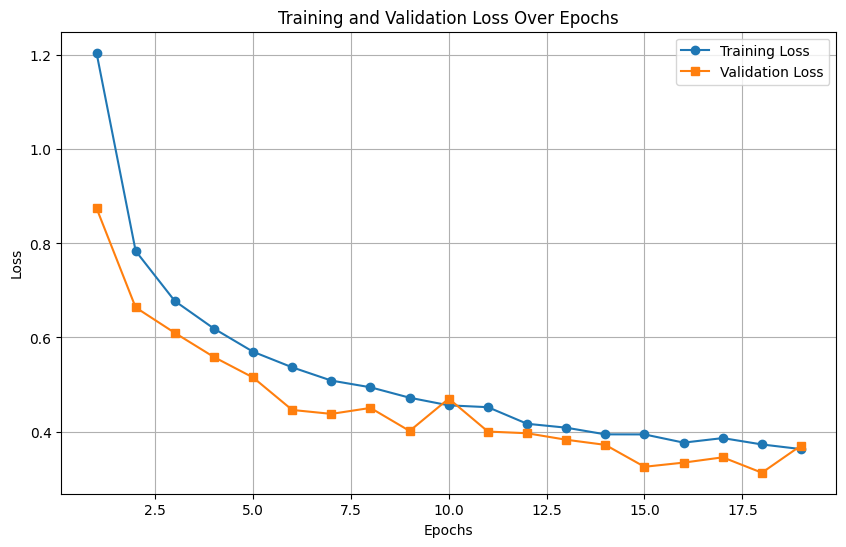

In [ ]:
# graphing output (hardcoded)

# Data for the plot
epochs = list(range(1, 20))  # Total epochs
train_loss = [1.205521, 0.783972, 0.677550, 0.618873, 0.569614, 0.536490,
              0.508308, 0.494024, 0.471858, 0.455632, 0.451748, 0.416464,
              0.408150, 0.393943, 0.393823, 0.376350, 0.386016, 0.372482, 0.362585]
valid_loss = [0.875182, 0.663818, 0.609764, 0.558378, 0.514891, 0.445841,
              0.437487, 0.450167, 0.401177, 0.469932, 0.399922, 0.396291,
              0.382486, 0.371579, 0.324984, 0.333847, 0.345115, 0.312360, 0.370182]

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, label='Training Loss', marker='o')
plt.plot(epochs, valid_loss, label='Validation Loss', marker='s')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
print(f"Output shape: {output.shape}, Target shape: {target.shape}")
print(f"Data batch size: {data.shape[0]}, Target batch size: {target.shape[0]}")


Output shape: torch.Size([1, 10]), Target shape: torch.Size([1])
Data batch size: 1, Target batch size: 1


In [ ]:
# track test loss
test_loss = 0.0
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
size=len(test_set)
predictions = np.zeros(size)
all_classes = np.zeros(size)
all_proba = np.zeros((size,10))
idx=0
model.eval()

# iterate over test data
for data, target in test_loader:
    # move tensors to GPU if CUDA is available
    if train_on_gpu:
        data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # update test loss
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)
    # compare predictions to true label
    correct_tensor = pred.eq(target.data.view_as(pred))
    correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())

    predictions[idx:idx+len(target)]=pred.to('cpu').numpy()
    all_classes[idx:idx+len(target)]=target.to('cpu').numpy()
    all_proba[idx:idx+len(target),:]=output.to('cpu').detach().numpy()
    idx+=len(target)


    # calculate test accuracy for each object class
    for i in range(len(target)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# average test loss
test_loss = test_loss/len(test_loader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(10):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            classes[i], 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

Test Loss: 0.304823

Test Accuracy of Tomato_Bacterial_spot: 88% (185/210)
Test Accuracy of Tomato_Early_blight: 59% (58/97)
Test Accuracy of Tomato_Late_blight: 88% (172/195)
Test Accuracy of Tomato_Leaf_Mold: 79% (64/81)
Test Accuracy of Tomato_Septoria_leaf_spot: 83% (127/153)
Test Accuracy of Tomato_Spider_mites_Two_spotted_spider_mite: 91% (161/176)
Test Accuracy of Tomato__Target_Spot: 88% (137/155)
Test Accuracy of Tomato__Tomato_YellowLeaf__Curl_Virus: 97% (303/312)
Test Accuracy of Tomato__Tomato_mosaic_virus: 92% (38/41)
Test Accuracy of Tomato_healthy: 97% (177/182)

Test Accuracy (Overall): 88% (1422/1602)


In [79]:
import itertools
def make_fig_cm(cm):
    fig = plt.figure(figsize=(12,12))
    plt.imshow(cm, interpolation='nearest', cmap='Blues')
    tick_marks = np.arange(10);
    plt.xticks(tick_marks, classes, rotation=90);
    plt.yticks(tick_marks, classes, rotation=0);
    plt.tight_layout();
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        coeff = f'{cm[i, j]}'
        plt.text(j, i, coeff, horizontalalignment="center", verticalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Actual');
    plt.xlabel('Predicted');

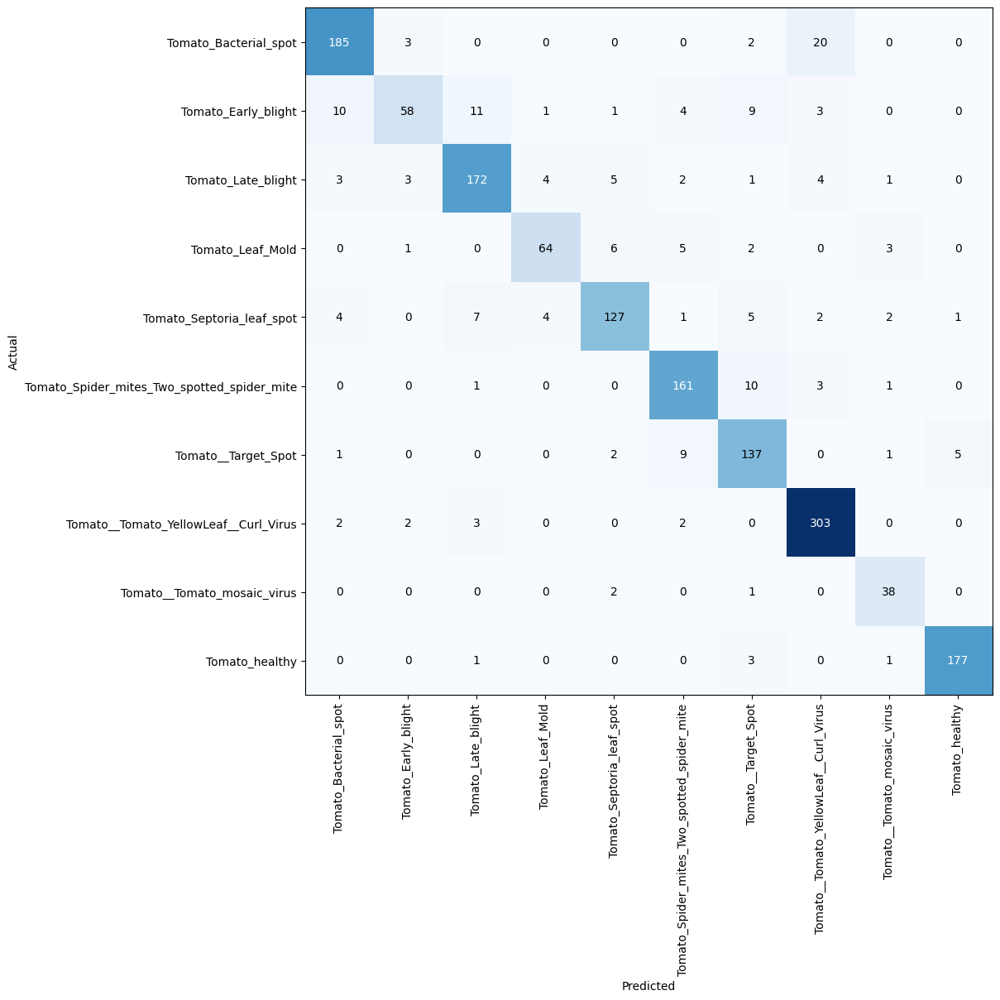

In [ ]:
cm = confusion_matrix(all_classes,predictions)
make_fig_cm(cm)

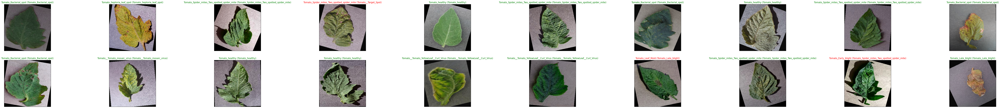

In [ ]:
# obtain one batch of test images
dataiter = iter(test_loader)
images, labels = next(dataiter)
images.numpy()

# move model inputs to cuda, if GPU available
if train_on_gpu:
    images = images.cuda()

# get sample outputs
output = model(images)
# convert output probabilities to predicted class
_, preds_tensor = torch.max(output, 1)
preds = np.squeeze(preds_tensor.numpy()) if not train_on_gpu else np.squeeze(preds_tensor.cpu().numpy())

# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(100, 10))
for idx in np.arange(20):
    ax = fig.add_subplot(2, 10, idx+1, xticks=[], yticks=[])
    imshow(images[idx] if not train_on_gpu else images[idx].cpu())
    ax.set_title("{} ({})".format(classes[preds[idx]], classes[labels[idx]]),
                 color=("green" if preds[idx]==labels[idx].item() else "red"))

# Comparing model performance with VGG

In [57]:
# we resize the images again to 512, 7, 7 because VGG and ResNet both expect this size in the input after flatting
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.Resize((224, 224)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Assuming RGB images
])

# Load dataset with transformations
dataset = datasets.ImageFolder(tomato_dir, transform=transform)

# Split dataset into training (80%), validation (10%), and testing (10%)
def split_dataset(dataset, train_ratio=0.8, val_ratio=0.1, test_ratio=0.1):
    assert train_ratio + val_ratio + test_ratio == 1, "Ratios must sum to 1"
    total_size = len(dataset)
    train_size = int(train_ratio * total_size)
    val_size = int(val_ratio * total_size)
    test_size = total_size - train_size - val_size

    return random_split(dataset, [train_size, val_size, test_size])

train_set, val_set, test_set = split_dataset(dataset)

# Create DataLoaders
train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32, shuffle=False)
test_loader = DataLoader(test_set, batch_size=32, shuffle=False)

In [100]:
# # Send model to device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using gpu: %s ' % torch.cuda.is_available())

Using gpu: True 


Break for model performance

In [101]:
model_vgg = models.vgg16(weights='DEFAULT')
model_vgg = model_vgg.to(device)

In [102]:
optimizer = optim.SGD(model_vgg.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()


In [103]:
for param in model_vgg.parameters():
    param.requires_grad = False
model_vgg.classifier._modules['6'] = nn.Linear(4096, 10)

In [105]:
# Ensure device consistency
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using gpu: %s ' % torch.cuda.is_available())

# Load the VGG model and move it to the device
model_vgg = models.vgg16(weights='DEFAULT')
model_vgg.classifier._modules['6'] = nn.Linear(4096, 10)  # Update the classifier
model_vgg = model_vgg.to(device)

# Freeze all VGG parameters
for param in model_vgg.features.parameters():
    param.requires_grad = False

# Define optimizer and loss
optimizer = optim.SGD(model_vgg.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

# Training function
def train_model(model, dataloader, size, epochs=1, optimizer=None):
    model.train()
    for epoch in range(epochs):
        running_loss = 0.0
        running_corrects = 0

        for inputs, classes in dataloader:
            # Move data to the same device as the model
            inputs = inputs.to(device)
            classes = classes.to(device)

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, classes)

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Compute statistics
            _, preds = torch.max(outputs, dim=1)
            running_loss += loss.item()
            running_corrects += torch.sum(preds == classes)

        epoch_loss = running_loss / size
        epoch_acc = running_corrects.double() / size
        print(f'Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

# Call the training function
train_model(model_vgg, train_loader, size=len(train_set), epochs=2, optimizer=optimizer)


Using gpu: True 
Loss: 0.0544 Acc: 0.4265
Loss: 0.0380 Acc: 0.6067


In [106]:
# beginning of layer freezing
inputs_try, labels_try = next(iter(val_loader))

In [107]:
inputs_try = inputs_try.to(device)
x_try = model_vgg.features(inputs_try)

In [108]:
x_try.shape

torch.Size([32, 512, 7, 7])

In [109]:
# function to precompute the VGG features
def preconvfeat(dataloader):
    conv_features = []
    labels_list = []
    for data in dataloader:
        inputs,labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        x = model_vgg.features(inputs)
        conv_features.extend(x.data.cpu().numpy())
        labels_list.extend(labels.data.cpu().numpy())
    conv_features = np.concatenate([[feat] for feat in conv_features])
    return (conv_features,labels_list)

In [110]:
%%time
conv_feat_train,labels_train = preconvfeat(train_loader)

CPU times: user 7min 36s, sys: 1.52 s, total: 7min 38s
Wall time: 2min 36s


In [111]:
conv_feat_train.shape

(12808, 512, 7, 7)

In [112]:
conv_feat_valid,labels_valid = preconvfeat(val_loader)

In [113]:
dtype=torch.float
datasetfeat_train = [[torch.from_numpy(f).type(dtype),torch.tensor(l).type(torch.long)] for (f,l) in zip(conv_feat_train,labels_train)]
datasetfeat_train = [(inputs.reshape(-1), classes) for [inputs,classes] in datasetfeat_train]
loaderfeat_train = torch.utils.data.DataLoader(datasetfeat_train, batch_size=128, shuffle=True)

In [114]:
ex=torch.from_numpy(conv_feat_train[0]).type(dtype)

In [115]:
ex.shape

torch.Size([512, 7, 7])

In [116]:
ex.reshape(-1).shape

torch.Size([25088])

In [117]:
%%time
train_model(model_vgg.classifier,dataloader=loaderfeat_train,size=len(train_set),epochs=400,optimizer=optimizer)

Loss: 0.0083 Acc: 0.6557
Loss: 0.0080 Acc: 0.6661
Loss: 0.0076 Acc: 0.6838
Loss: 0.0073 Acc: 0.7010
Loss: 0.0071 Acc: 0.7054
Loss: 0.0068 Acc: 0.7110
Loss: 0.0066 Acc: 0.7196
Loss: 0.0064 Acc: 0.7334
Loss: 0.0063 Acc: 0.7337
Loss: 0.0062 Acc: 0.7359
Loss: 0.0060 Acc: 0.7488
Loss: 0.0059 Acc: 0.7509
Loss: 0.0057 Acc: 0.7610
Loss: 0.0057 Acc: 0.7640
Loss: 0.0055 Acc: 0.7642
Loss: 0.0054 Acc: 0.7730
Loss: 0.0053 Acc: 0.7778
Loss: 0.0052 Acc: 0.7804
Loss: 0.0051 Acc: 0.7879
Loss: 0.0050 Acc: 0.7875
Loss: 0.0050 Acc: 0.7888
Loss: 0.0048 Acc: 0.7961
Loss: 0.0047 Acc: 0.7985
Loss: 0.0046 Acc: 0.7999
Loss: 0.0047 Acc: 0.8000
Loss: 0.0045 Acc: 0.8082
Loss: 0.0045 Acc: 0.8089
Loss: 0.0045 Acc: 0.8086
Loss: 0.0043 Acc: 0.8196
Loss: 0.0043 Acc: 0.8189
Loss: 0.0043 Acc: 0.8154
Loss: 0.0042 Acc: 0.8207
Loss: 0.0041 Acc: 0.8222
Loss: 0.0041 Acc: 0.8268
Loss: 0.0040 Acc: 0.8297
Loss: 0.0039 Acc: 0.8317
Loss: 0.0039 Acc: 0.8306
Loss: 0.0039 Acc: 0.8367
Loss: 0.0038 Acc: 0.8399
Loss: 0.0038 Acc: 0.8411


In [118]:
datasetfeat_valid = [[torch.from_numpy(f).type(dtype),torch.tensor(l).type(torch.long)] for (f,l) in zip(conv_feat_valid,labels_valid)]
datasetfeat_valid = [(inputs.reshape(-1), classes) for [inputs,classes] in datasetfeat_valid]
loaderfeat_valid = torch.utils.data.DataLoader(datasetfeat_valid, batch_size=128, shuffle=False)

In [119]:
# Test function for VGG16 with detailed class-wise accuracy and loss tracking
def test_vgg_model(model, test_loader, num_classes=10, train_on_gpu=False):
    test_loss = 0.0
    class_correct = list(0. for i in range(num_classes))
    class_total = list(0. for i in range(num_classes))
    size = len(test_loader.dataset)

    predictions = np.zeros(size)
    all_classes = np.zeros(size)
    all_proba = np.zeros((size, num_classes))
    idx = 0

    model.eval()

    with torch.no_grad():
        for data, target in test_loader:
            # Move data and target to GPU if available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()

            # Forward pass
            output = model(data)

            # Calculate batch loss
            loss = criterion(output, target)

            # Update total test loss
            test_loss += loss.item() * data.size(0)

            # Get predictions
            _, pred = torch.max(output, 1)

            # Compare predictions to true labels
            correct_tensor = pred.eq(target.data.view_as(pred))
            correct = np.squeeze(correct_tensor.cpu().numpy()) if train_on_gpu else np.squeeze(correct_tensor.numpy())

            # Store predictions, true classes, and probabilities
            predictions[idx:idx + len(target)] = pred.cpu().numpy()
            all_classes[idx:idx + len(target)] = target.cpu().numpy()
            all_proba[idx:idx + len(target), :] = output.cpu().numpy()
            idx += len(target)

            # Calculate class-wise accuracy
            for i in range(len(target)):
                label = target.data[i]
                class_correct[label] += correct[i].item()
                class_total[label] += 1

    # Calculate average test loss
    test_loss /= size
    print(f'Test Loss: {test_loss:.6f}\n')

    for i in range(10):
        if class_total[i] > 0:
            print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
                classes[i], 100 * class_correct[i] / class_total[i],
                np.sum(class_correct[i]), np.sum(class_total[i])))
        else:
            print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))



    # Print overall accuracy
    overall_accuracy = 100. * np.sum(class_correct) / np.sum(class_total)
    print(f'\nTest Accuracy (Overall): {overall_accuracy:.2f}% ({int(np.sum(class_correct))}/{int(np.sum(class_total))})')

    return predictions, all_proba, all_classes

# Example usage
predictions, all_proba, all_classes = test_vgg_model(model_vgg, test_loader, num_classes=10, train_on_gpu=torch.cuda.is_available())


Test Loss: 0.369581

Test Accuracy of Tomato_Bacterial_spot: 96% (194/201)
Test Accuracy of Tomato_Early_blight: 62% (64/103)
Test Accuracy of Tomato_Late_blight: 91% (173/190)
Test Accuracy of Tomato_Leaf_Mold: 83% (77/92)
Test Accuracy of Tomato_Septoria_leaf_spot: 88% (155/175)
Test Accuracy of Tomato_Spider_mites_Two_spotted_spider_mite: 93% (148/159)
Test Accuracy of Tomato__Target_Spot: 75% (103/137)
Test Accuracy of Tomato__Tomato_YellowLeaf__Curl_Virus: 95% (315/329)
Test Accuracy of Tomato__Tomato_mosaic_virus: 87% (41/47)
Test Accuracy of Tomato_healthy: 97% (165/169)

Test Accuracy (Overall): 89.58% (1435/1602)


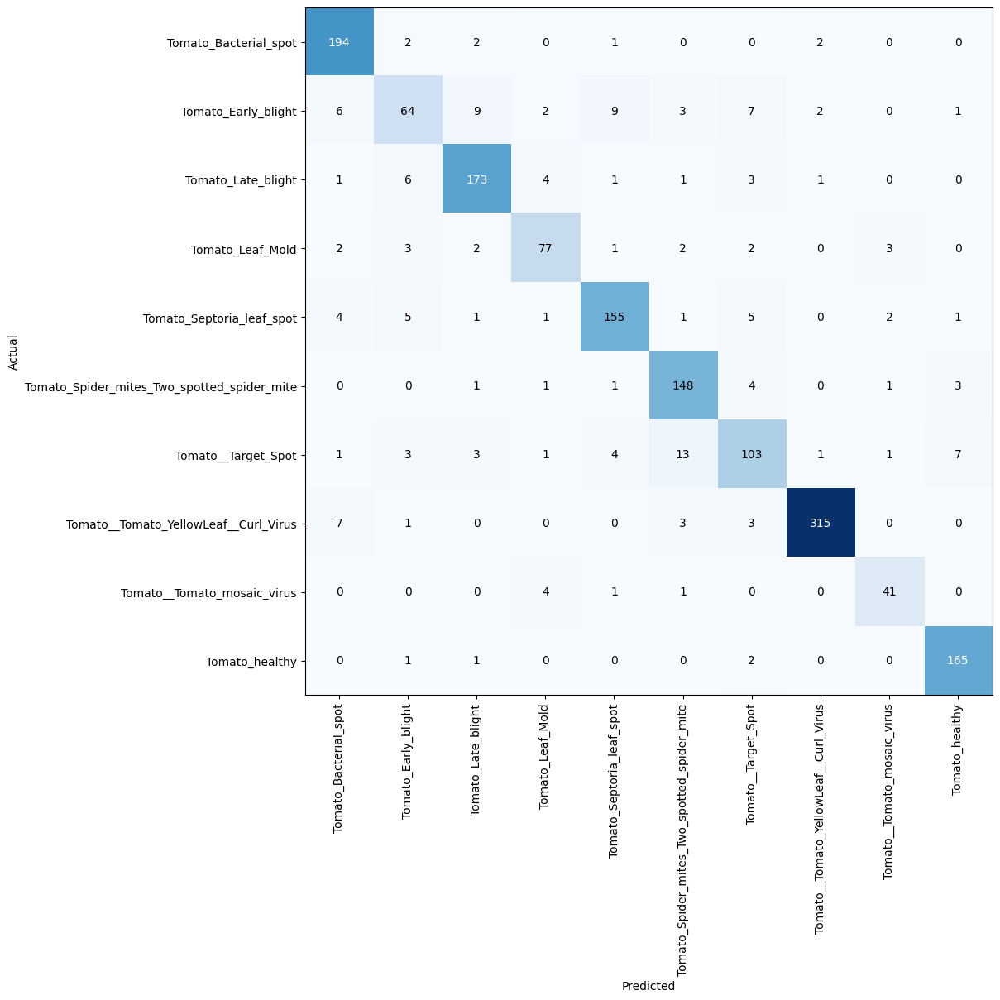

In [120]:
cm = confusion_matrix(all_classes,predictions)
make_fig_cm(cm)

# ResNET

In [95]:
# Set up device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using gpu: %s ' % torch.cuda.is_available())

# Load the ResNet model and modify the classifier
model_resnet = models.resnet18(weights='DEFAULT')
num_features = model_resnet.fc.in_features
model_resnet.fc = nn.Linear(num_features, 10)  # Replace the final layer for 10 classes
model_resnet = model_resnet.to(device)

# Freeze all layers except the newly added classifier
for param in model_resnet.parameters():
    param.requires_grad = False
for param in model_resnet.fc.parameters():
    param.requires_grad = True

# Define optimizer and loss function
optimizer = optim.SGD(model_resnet.fc.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

# Training function
def train_model(model, dataloader, size, epochs=1, optimizer=None):
    model.train()
    for epoch in range(epochs):
        running_loss = 0.0
        running_corrects = 0

        for inputs, classes in dataloader:
            # Move data to the same device as the model
            inputs = inputs.to(device)
            classes = classes.to(device)

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, classes)

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Compute statistics
            _, preds = torch.max(outputs, dim=1)
            running_loss += loss.item()
            running_corrects += torch.sum(preds == classes)

        epoch_loss = running_loss / size
        epoch_acc = running_corrects.double() / size
        print(f'Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')


Using gpu: True 


In [96]:
train_model(model_resnet, train_loader, size=len(train_set), epochs=2, optimizer=optimizer)


Loss: 0.0612 Acc: 0.3684
Loss: 0.0477 Acc: 0.5867


In [97]:
# Modify the preconvfeat function for ResNet, freezing is different than VGG but same concept
def preconvfeat_resnet(dataloader, model):
    model.eval()  # Set model to evaluation mode
    conv_features = []
    labels_list = []

    with torch.no_grad():  # Disable gradient computation for feature extraction
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Extract features up to the final pooling layer
            x = model.conv1(inputs)
            x = model.bn1(x)
            x = model.relu(x)
            x = model.maxpool(x)

            x = model.layer1(x)
            x = model.layer2(x)
            x = model.layer3(x)
            x = model.layer4(x)

            # Apply global average pooling (adaptive pooling to 1x1)
            x = torch.nn.functional.adaptive_avg_pool2d(x, (1, 1))

            # Flatten features
            x = x.view(x.size(0), -1)

            conv_features.extend(x.data.cpu().numpy())
            labels_list.extend(labels.data.cpu().numpy())

    return np.array(conv_features), np.array(labels_list)


# Use the updated preconvfeat_resnet function
conv_feat_train, labels_train = preconvfeat_resnet(train_loader, model_resnet)
conv_feat_valid, labels_valid = preconvfeat_resnet(val_loader, model_resnet)

# Check the shapes of the features
print(f"conv_feat_train.shape: {conv_feat_train.shape}")
print(f"conv_feat_valid.shape: {conv_feat_valid.shape}")

# Create datasets and DataLoaders for training the classifier
dtype = torch.float
datasetfeat_train = [
    [torch.from_numpy(f).type(dtype), torch.tensor(l).type(torch.long)]
    for (f, l) in zip(conv_feat_train, labels_train)
]

loaderfeat_train = torch.utils.data.DataLoader(
    datasetfeat_train, batch_size=128, shuffle=True
)

# Train the classifier with precomputed features
train_model(
    model_resnet.fc,  # Train only the classifier (fully connected layer)
    dataloader=loaderfeat_train,
    size=len(train_set),
    epochs=400,
    optimizer=optimizer,
)


conv_feat_train.shape: (12808, 512)
conv_feat_valid.shape: (1601, 512)
Loss: 0.0104 Acc: 0.6563
Loss: 0.0100 Acc: 0.6686
Loss: 0.0097 Acc: 0.6800
Loss: 0.0093 Acc: 0.6900
Loss: 0.0090 Acc: 0.6996
Loss: 0.0088 Acc: 0.7082
Loss: 0.0086 Acc: 0.7146
Loss: 0.0083 Acc: 0.7216
Loss: 0.0081 Acc: 0.7293
Loss: 0.0079 Acc: 0.7344
Loss: 0.0078 Acc: 0.7403
Loss: 0.0076 Acc: 0.7472
Loss: 0.0074 Acc: 0.7524
Loss: 0.0073 Acc: 0.7559
Loss: 0.0072 Acc: 0.7630
Loss: 0.0070 Acc: 0.7657
Loss: 0.0070 Acc: 0.7683
Loss: 0.0068 Acc: 0.7708
Loss: 0.0067 Acc: 0.7742
Loss: 0.0066 Acc: 0.7783
Loss: 0.0065 Acc: 0.7793
Loss: 0.0065 Acc: 0.7824
Loss: 0.0064 Acc: 0.7854
Loss: 0.0063 Acc: 0.7864
Loss: 0.0062 Acc: 0.7883
Loss: 0.0061 Acc: 0.7920
Loss: 0.0061 Acc: 0.7939
Loss: 0.0060 Acc: 0.7953
Loss: 0.0059 Acc: 0.7984
Loss: 0.0058 Acc: 0.8003
Loss: 0.0058 Acc: 0.8012
Loss: 0.0057 Acc: 0.8047
Loss: 0.0057 Acc: 0.8045
Loss: 0.0056 Acc: 0.8068
Loss: 0.0056 Acc: 0.8091
Loss: 0.0056 Acc: 0.8094
Loss: 0.0055 Acc: 0.8114
Loss

In [98]:
predictions, all_proba, all_classes = test_vgg_model(model_resnet, test_loader, num_classes=10, train_on_gpu=torch.cuda.is_available())


Test Loss: 0.398452

Test Accuracy of Tomato_Bacterial_spot: 90% (182/201)
Test Accuracy of Tomato_Early_blight: 54% (56/103)
Test Accuracy of Tomato_Late_blight: 85% (162/190)
Test Accuracy of Tomato_Leaf_Mold: 76% (70/92)
Test Accuracy of Tomato_Septoria_leaf_spot: 86% (151/175)
Test Accuracy of Tomato_Spider_mites_Two_spotted_spider_mite: 85% (136/159)
Test Accuracy of Tomato__Target_Spot: 81% (111/137)
Test Accuracy of Tomato__Tomato_YellowLeaf__Curl_Virus: 95% (315/329)
Test Accuracy of Tomato__Tomato_mosaic_virus: 78% (37/47)
Test Accuracy of Tomato_healthy: 94% (159/169)

Test Accuracy (Overall): 86.08% (1379/1602)


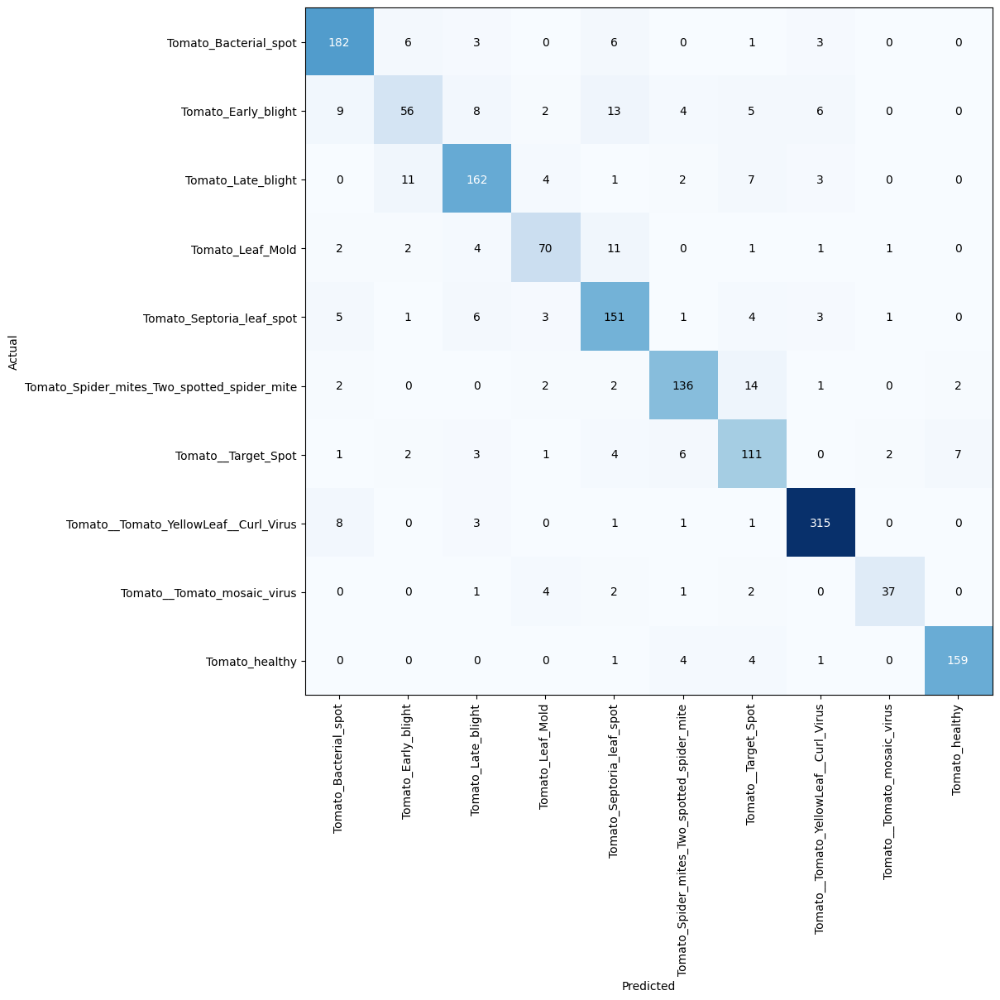

In [99]:
cm = confusion_matrix(all_classes,predictions)
make_fig_cm(cm)

Model comparison analysis is in the report.